In [1]:
import pandas as pd
import numpy as np

In [322]:
df = pd.read_csv('Automobile price data _Raw_.csv')

In [4]:
df.head()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450


In [259]:
df.columns

Index(['symboling', 'normalized-losses', 'make', 'fuel-type', 'aspiration',
       'num-of-doors', 'body-style', 'drive-wheels', 'engine-location',
       'wheel-base', 'length', 'width', 'height', 'curb-weight', 'engine-type',
       'num-of-cylinders', 'engine-size', 'fuel-system', 'bore', 'stroke',
       'compression-ratio', 'horsepower', 'peak-rpm', 'city-mpg',
       'highway-mpg', 'price'],
      dtype='object')

In [257]:
df = df.replace('?', np.nan)

### EDA

In [258]:
import pandas_profiling
pandas_profiling.ProfileReport(df)

In [260]:
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.min(), x.quantile(0.01), x.quantile(0.05),x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])



In [262]:
df.iloc[:,[0,1]].apply(lambda x: var_summary(x)).T

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
symboling,201.0,0.0,169.0,0.840796,1.0,1.254802,1.574527,-2.0,-2.0,-1.0,-1.0,0.0,1.0,2.0,3.0,3.0,3.00,3.0
normalized-losses,164.0,37.0,20008.0,122.000000,115.0,35.442168,1256.147239,65.0,65.0,74.0,83.6,94.0,115.0,150.0,164.0,188.0,209.58,256.0


In [323]:
#Now to go over this manually

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          205 non-null    int64  
 1   normalized-losses  205 non-null    object 
 2   make               205 non-null    object 
 3   fuel-type          205 non-null    object 
 4   aspiration         205 non-null    object 
 5   num-of-doors       205 non-null    object 
 6   body-style         205 non-null    object 
 7   drive-wheels       205 non-null    object 
 8   engine-location    205 non-null    object 
 9   wheel-base         205 non-null    float64
 10  length             205 non-null    float64
 11  width              205 non-null    float64
 12  height             205 non-null    float64
 13  curb-weight        205 non-null    int64  
 14  engine-type        205 non-null    object 
 15  num-of-cylinders   205 non-null    object 
 16  engine-size        205 non

In [53]:
#Should remove rows with '?' value because we need to predict the price, so we cant just replace it with anything like mean or median
df.price.value_counts()

6692     2
8845     2
6229     2
8921     2
18150    2
        ..
6295     1
35550    1
9960     1
7499     1
8013     1
Name: price, Length: 186, dtype: int64

In [324]:
#Doing cleanig here because this will help in EDA Graphs
df.price.replace('?', np.nan, inplace = True)
df.dropna(axis = 0, inplace = True)

In [325]:
df['price'] = pd.to_numeric(df['price'])

In [326]:

df["normalized-losses"].value_counts()

?      37
161    11
91      8
150     7
134     6
128     6
104     6
85      5
65      5
103     5
102     5
168     5
94      5
95      5
74      5
118     4
93      4
106     4
122     4
148     4
137     3
115     3
101     3
154     3
125     3
83      3
81      2
158     2
164     2
129     2
113     2
108     2
145     2
188     2
110     2
197     2
89      2
194     2
192     2
153     2
119     2
87      2
107     1
231     1
186     1
121     1
256     1
98      1
90      1
77      1
78      1
142     1
Name: normalized-losses, dtype: int64

In [327]:
df['normalized-losses'] = df['normalized-losses'].replace('?', np.nan) 


In [328]:
df['normalized-losses'] = pd.to_numeric(df['normalized-losses'])

<AxesSubplot:xlabel='normalized-losses', ylabel='Count'>

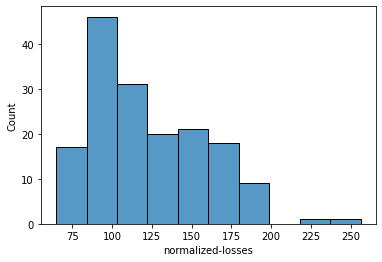

In [329]:
sns.histplot(df['normalized-losses'])

<AxesSubplot:xlabel='normalized-losses', ylabel='price'>

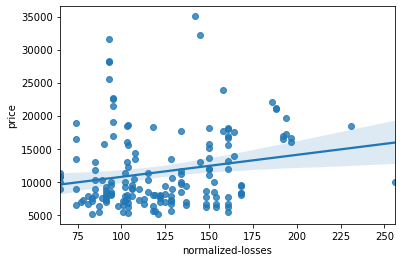

In [330]:
#Not great correlation, not a good predictor
sns.regplot(x = 'normalized-losses', y = 'price', data = df)

In [331]:
df.corr()

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,compression-ratio,city-mpg,highway-mpg,price
symboling,1.000000,0.528667,-0.535987,-0.365404,-0.242423,-0.550160,-0.233118,-0.110581,-0.182196,-0.035527,0.036233,-0.082391
normalized-losses,0.528667,1.000000,-0.074362,0.023220,0.105073,-0.432335,0.119893,0.167365,-0.132654,-0.258502,-0.210768,0.203254
wheel-base,-0.535987,-0.074362,1.000000,0.876024,0.814507,0.590742,0.782097,0.572027,0.250313,-0.470606,-0.543304,0.584642
length,-0.365404,0.023220,0.876024,1.000000,0.857170,0.492063,0.880665,0.685025,0.159733,-0.665192,-0.698142,0.690628
width,-0.242423,0.105073,0.814507,0.857170,1.000000,0.306002,0.866201,0.729436,0.189867,-0.633531,-0.680635,0.751265
height,-0.550160,-0.432335,0.590742,0.492063,0.306002,1.000000,0.307581,0.074694,0.259737,-0.049800,-0.104812,0.135486
curb-weight,-0.233118,0.119893,0.782097,0.880665,0.866201,0.307581,1.000000,0.849072,0.156433,-0.749543,-0.794889,0.834415
engine-size,-0.110581,0.167365,0.572027,0.685025,0.729436,0.074694,0.849072,1.000000,0.028889,-0.650546,-0.679571,0.872335
compression-ratio,-0.182196,-0.132654,0.250313,0.159733,0.189867,0.259737,0.156433,0.028889,1.000000,0.331425,0.268465,0.071107
city-mpg,-0.035527,-0.258502,-0.470606,-0.665192,-0.633531,-0.049800,-0.749543,-0.650546,0.331425,1.000000,0.972044,-0.686571


In [332]:
df.describe()

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,compression-ratio,city-mpg,highway-mpg,price
count,201.000000,164.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000
mean,0.840796,122.000000,98.797015,174.200995,65.889055,53.766667,2555.666667,126.875622,10.164279,25.179104,30.686567,13207.129353
std,1.254802,35.442168,6.066366,12.322175,2.101471,2.447822,517.296727,41.546834,4.004965,6.423220,6.815150,7947.066342
min,-2.000000,65.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,7.000000,13.000000,16.000000,5118.000000
25%,0.000000,94.000000,94.500000,166.800000,64.100000,52.000000,2169.000000,98.000000,8.600000,19.000000,25.000000,7775.000000
50%,1.000000,115.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,9.000000,24.000000,30.000000,10295.000000
75%,2.000000,150.000000,102.400000,183.500000,66.600000,55.500000,2926.000000,141.000000,9.400000,30.000000,34.000000,16500.000000
max,3.000000,256.000000,120.900000,208.100000,72.000000,59.800000,4066.000000,326.000000,23.000000,49.000000,54.000000,45400.000000


In [333]:
#Name of the company doesn't change the prices of the car so we should remove this column
df.make.unique()

array(['alfa-romero', 'audi', 'bmw', 'chevrolet', 'dodge', 'honda',
       'isuzu', 'jaguar', 'mazda', 'mercedes-benz', 'mercury',
       'mitsubishi', 'nissan', 'peugot', 'plymouth', 'porsche', 'renault',
       'saab', 'subaru', 'toyota', 'volkswagen', 'volvo'], dtype=object)

In [334]:
df['symboling'].unique()

array([ 3,  1,  2,  0, -1, -2], dtype=int64)

<AxesSubplot:xlabel='symboling', ylabel='price'>

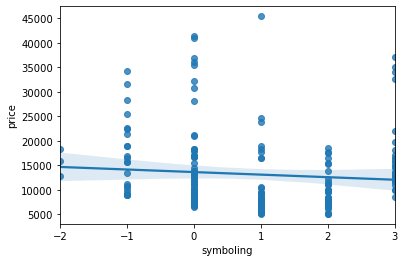

In [335]:
#Not a great predictor
sns.regplot(x = 'symboling', y = 'price', data = df)

In [336]:
df["normalized-losses"].value_counts()

161.0    11
91.0      8
150.0     7
104.0     6
128.0     6
134.0     6
102.0     5
85.0      5
103.0     5
168.0     5
74.0      5
95.0      5
94.0      5
65.0      5
122.0     4
148.0     4
118.0     4
93.0      4
106.0     4
115.0     3
125.0     3
83.0      3
101.0     3
137.0     3
154.0     3
188.0     2
81.0      2
192.0     2
158.0     2
145.0     2
113.0     2
110.0     2
153.0     2
129.0     2
194.0     2
197.0     2
87.0      2
89.0      2
119.0     2
164.0     2
108.0     2
231.0     1
107.0     1
78.0      1
256.0     1
98.0      1
121.0     1
77.0      1
142.0     1
90.0      1
186.0     1
Name: normalized-losses, dtype: int64

In [337]:
#Will need Label Encoding
df['fuel-type'].unique()

array(['gas', 'diesel'], dtype=object)

<AxesSubplot:xlabel='fuel-type', ylabel='Count'>

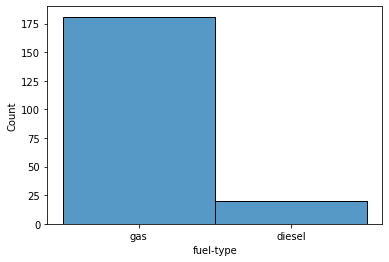

In [338]:
sns.histplot(df['fuel-type'])

<AxesSubplot:xlabel='fuel-type', ylabel='price'>

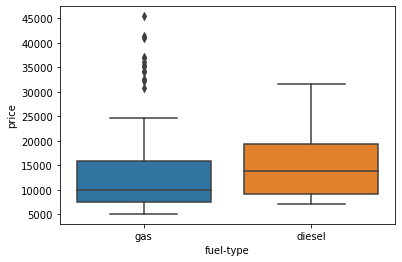

In [339]:
sns.boxplot(x = 'fuel-type', y = 'price', data = df)

In [340]:
#this column will need Label Encoding
df.aspiration.unique()

array(['std', 'turbo'], dtype=object)

<AxesSubplot:xlabel='aspiration', ylabel='price'>

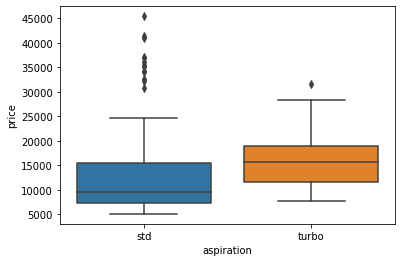

In [341]:
#Turbo aspiration is having higher price
sns.boxplot(x = 'aspiration', y = 'price', data = df)

In [342]:
df["num-of-doors"].unique()

array(['two', 'four', '?'], dtype=object)

In [343]:
#as the number of '?' values is less it wouldn't affect that much if we delete these 2 rows or replace the values with mode, we can do either
#And after we can Label Encode
df['num-of-doors'].value_counts()

four    113
two      86
?         2
Name: num-of-doors, dtype: int64

<AxesSubplot:xlabel='num-of-doors', ylabel='price'>

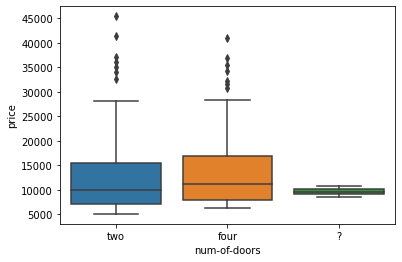

In [344]:
sns.boxplot(x = 'num-of-doors', y = 'price', data = df)

<AxesSubplot:xlabel='body-style', ylabel='symboling'>

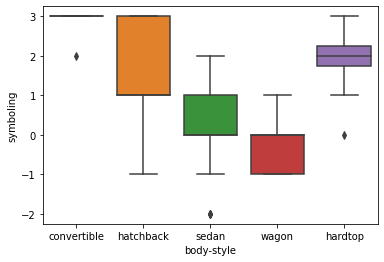

In [345]:
sns.boxplot(x = 'body-style', y = 'symboling', data = df)

In [346]:
df["body-style"].unique()

array(['convertible', 'hatchback', 'sedan', 'wagon', 'hardtop'],
      dtype=object)

In [347]:
import seaborn as sns

<AxesSubplot:xlabel='body-style', ylabel='Count'>

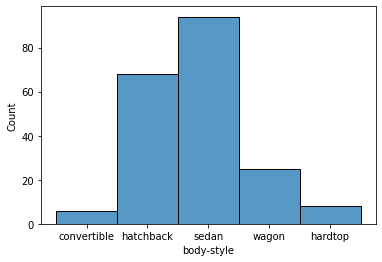

In [348]:
#Number of sedans in this data is very high
sns.histplot(df["body-style"])

<AxesSubplot:xlabel='body-style', ylabel='price'>

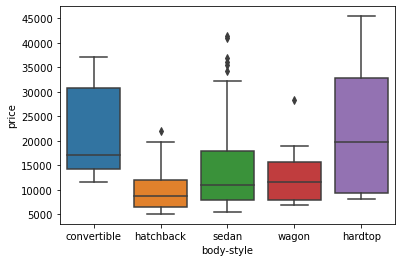

In [349]:
#On average Hardtop has the highest price
sns.boxplot(x = 'body-style', y = 'price', data = df)

<AxesSubplot:xlabel='body-style', ylabel='symboling'>

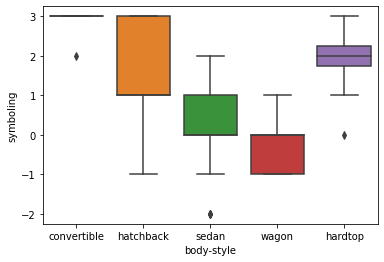

In [350]:
sns.boxplot(x = 'body-style', y = 'symboling', data = df)

In [351]:
df['drive-wheels'].unique()

array(['rwd', 'fwd', '4wd'], dtype=object)

In [352]:
#Most of the cars in this data are fwd drive
df['drive-wheels'].value_counts()

fwd    118
rwd     75
4wd      8
Name: drive-wheels, dtype: int64

<AxesSubplot:xlabel='drive-wheels', ylabel='price'>

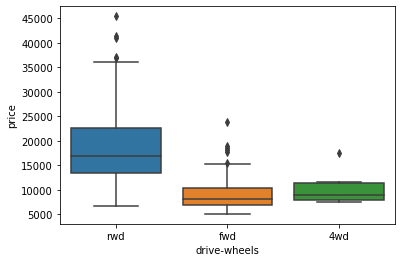

In [353]:
#rwd seems to have higher prices
sns.boxplot(x = 'drive-wheels', y = 'price', data = df)

<AxesSubplot:xlabel='drive-wheels', ylabel='symboling'>

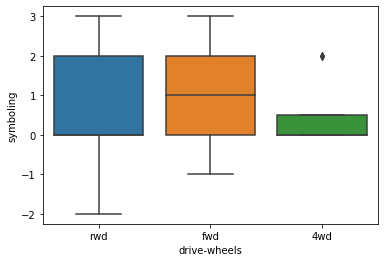

In [354]:
sns.boxplot(x = 'drive-wheels', y = 'symboling', data = df)

In [355]:
df['engine-location'].unique()

array(['front', 'rear'], dtype=object)

<AxesSubplot:xlabel='engine-location', ylabel='Count'>

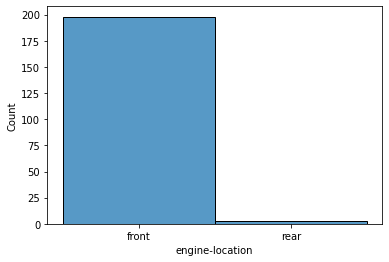

In [356]:
sns.histplot(df['engine-location'])

In [357]:
#we should delete this column because only 3 out of 201 values are different
df['engine-location'].value_counts()

front    198
rear       3
Name: engine-location, dtype: int64

<AxesSubplot:xlabel='engine-location', ylabel='price'>

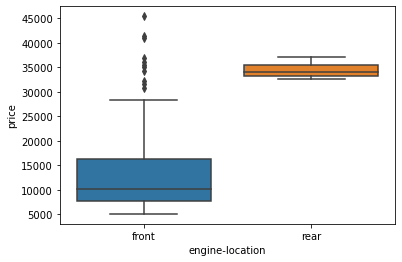

In [358]:
sns.boxplot(x = 'engine-location', y = 'price', data = df)

In [359]:
df.corr()

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,compression-ratio,city-mpg,highway-mpg,price
symboling,1.000000,0.528667,-0.535987,-0.365404,-0.242423,-0.550160,-0.233118,-0.110581,-0.182196,-0.035527,0.036233,-0.082391
normalized-losses,0.528667,1.000000,-0.074362,0.023220,0.105073,-0.432335,0.119893,0.167365,-0.132654,-0.258502,-0.210768,0.203254
wheel-base,-0.535987,-0.074362,1.000000,0.876024,0.814507,0.590742,0.782097,0.572027,0.250313,-0.470606,-0.543304,0.584642
length,-0.365404,0.023220,0.876024,1.000000,0.857170,0.492063,0.880665,0.685025,0.159733,-0.665192,-0.698142,0.690628
width,-0.242423,0.105073,0.814507,0.857170,1.000000,0.306002,0.866201,0.729436,0.189867,-0.633531,-0.680635,0.751265
height,-0.550160,-0.432335,0.590742,0.492063,0.306002,1.000000,0.307581,0.074694,0.259737,-0.049800,-0.104812,0.135486
curb-weight,-0.233118,0.119893,0.782097,0.880665,0.866201,0.307581,1.000000,0.849072,0.156433,-0.749543,-0.794889,0.834415
engine-size,-0.110581,0.167365,0.572027,0.685025,0.729436,0.074694,0.849072,1.000000,0.028889,-0.650546,-0.679571,0.872335
compression-ratio,-0.182196,-0.132654,0.250313,0.159733,0.189867,0.259737,0.156433,0.028889,1.000000,0.331425,0.268465,0.071107
city-mpg,-0.035527,-0.258502,-0.470606,-0.665192,-0.633531,-0.049800,-0.749543,-0.650546,0.331425,1.000000,0.972044,-0.686571


In [360]:
df['wheel-base'].unique()

array([ 88.6,  94.5,  99.8,  99.4, 105.8, 101.2, 103.5, 110. ,  88.4,
        93.7, 103.3,  95.9,  86.6,  96.5,  94.3,  96. , 113. , 102. ,
        93.1,  95.3,  98.8, 104.9, 106.7, 115.6,  96.6, 120.9, 112. ,
       102.7,  93. ,  96.3,  95.1,  97.2, 100.4,  91.3,  99.2, 107.9,
       114.2, 108. ,  89.5,  96.1,  99.1,  93.3,  97. ,  96.9,  95.7,
        98.4, 102.4, 102.9, 104.5,  97.3, 104.3, 109.1])

<AxesSubplot:xlabel='wheel-base', ylabel='price'>

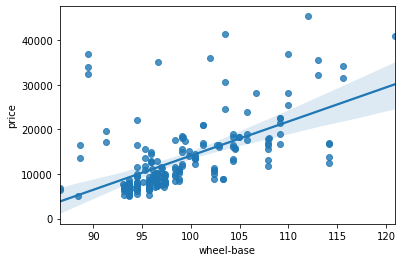

In [361]:
#Good enough correlation, as the wheel base is increasing generally the price is also increasing
sns.regplot(x = 'wheel-base', y = 'price', data = df)

In [362]:
df['length'].unique()

array([168.8, 171.2, 176.6, 177.3, 192.7, 176.8, 189. , 193.8, 197. ,
       141.1, 155.9, 158.8, 157.3, 174.6, 173.2, 144.6, 150. , 163.4,
       157.1, 167.5, 175.4, 169.1, 170.7, 172.6, 199.6, 191.7, 159.1,
       166.8, 169. , 177.8, 175. , 190.9, 187.5, 202.6, 180.3, 208.1,
       199.2, 178.4, 173. , 172.4, 165.3, 170.2, 165.6, 162.4, 173.4,
       181.7, 184.6, 178.5, 186.7, 198.9, 167.3, 168.9, 181.5, 186.6,
       156.9, 157.9, 172. , 173.5, 173.6, 158.7, 169.7, 166.3, 168.7,
       176.2, 175.6, 183.5, 187.8, 171.7, 159.3, 165.7, 180.2, 183.1,
       188.8])

<AxesSubplot:xlabel='length', ylabel='price'>

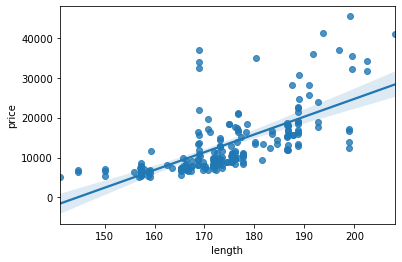

In [363]:
#Good enough correlation, as the length is increasing the price is also increasing
sns.regplot(x = 'length', y = 'price', data = df)

In [364]:
df['width'].unique()

array([64.1, 65.5, 66.2, 66.4, 66.3, 71.4, 64.8, 66.9, 67.9, 70.9, 60.3,
       63.6, 63.8, 64.6, 63.9, 64. , 65.2, 62.5, 66. , 61.8, 69.6, 70.6,
       64.2, 65.7, 66.5, 66.1, 70.3, 71.7, 70.5, 72. , 68. , 64.4, 65.4,
       68.4, 68.3, 65. , 66.6, 63.4, 65.6, 67.7, 67.2, 68.9, 68.8])

<AxesSubplot:xlabel='length', ylabel='price'>

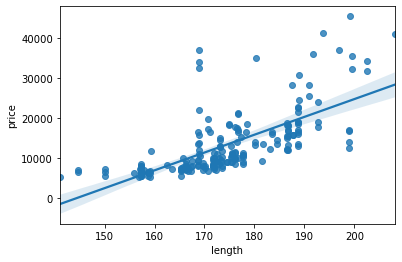

In [365]:
#Good enough correlation, as the width is increasing the price is also increasing
sns.regplot(x = 'length', y = 'price', data = df)

In [366]:
df['height'].unique()

array([48.8, 52.4, 54.3, 53.1, 55.7, 55.9, 53.7, 56.3, 53.2, 52. , 50.8,
       50.6, 59.8, 50.2, 52.6, 54.5, 58.3, 53.3, 54.1, 51. , 53.5, 51.4,
       52.8, 47.8, 49.6, 55.5, 54.4, 56.5, 58.7, 54.9, 56.7, 55.4, 54.8,
       49.4, 51.6, 54.7, 55.1, 56.1, 49.7, 56. , 55.2, 50.5, 52.5, 53. ,
       59.1, 53.9, 55.6, 56.2, 57.5])

<AxesSubplot:xlabel='height', ylabel='price'>

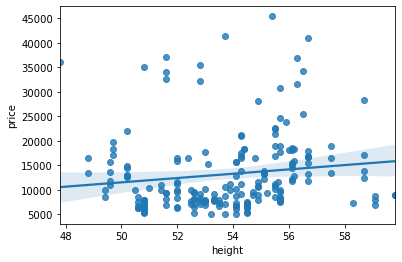

In [367]:
#Not Good enough correlation, correlation of [0.135486]
sns.regplot(x = 'height', y = 'price', data = df)

In [368]:
df['curb-weight'].unique()

array([2548, 2823, 2337, 2824, 2507, 2844, 2954, 3086, 2395, 2710, 2765,
       3055, 3230, 3380, 3505, 1488, 1874, 1909, 1876, 2128, 1967, 1989,
       2191, 2535, 2811, 1713, 1819, 1837, 1940, 1956, 2010, 2024, 2236,
       2289, 2304, 2372, 2465, 2293, 2734, 4066, 3950, 1890, 1900, 1905,
       1945, 1950, 2380, 2385, 2500, 2410, 2443, 2425, 2670, 2700, 3515,
       3750, 3495, 3770, 3740, 3685, 3900, 3715, 2910, 1918, 1944, 2004,
       2145, 2370, 2328, 2833, 2921, 2926, 2365, 2405, 2403, 1889, 2017,
       1938, 1951, 2028, 1971, 2037, 2008, 2324, 2302, 3095, 3296, 3060,
       3071, 3139, 3020, 3197, 3430, 3075, 3252, 3285, 3485, 3130, 2818,
       2778, 2756, 2800, 2579, 2460, 2658, 2695, 2707, 2758, 2808, 2847,
       2050, 2120, 2240, 2190, 2340, 2510, 2290, 2455, 2420, 2650, 1985,
       2040, 2015, 2280, 3110, 2081, 2109, 2275, 2094, 2122, 2140, 2169,
       2204, 2265, 2300, 2540, 2536, 2551, 2679, 2714, 2975, 2326, 2480,
       2414, 2458, 2976, 3016, 3131, 3151, 2261, 22

<AxesSubplot:xlabel='curb-weight', ylabel='price'>

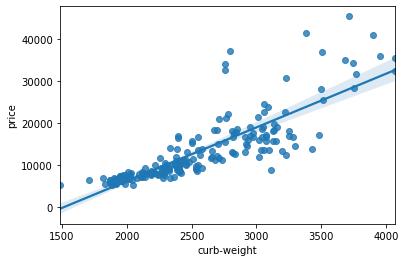

In [369]:
#Great correlation, as the curb-weight is increasing the price is also increasing
sns.regplot(x = 'curb-weight', y = 'price', data = df)

In [370]:
df.columns

Index(['symboling', 'normalized-losses', 'make', 'fuel-type', 'aspiration',
       'num-of-doors', 'body-style', 'drive-wheels', 'engine-location',
       'wheel-base', 'length', 'width', 'height', 'curb-weight', 'engine-type',
       'num-of-cylinders', 'engine-size', 'fuel-system', 'bore', 'stroke',
       'compression-ratio', 'horsepower', 'peak-rpm', 'city-mpg',
       'highway-mpg', 'price'],
      dtype='object')

In [371]:
df['engine-type'].unique()

array(['dohc', 'ohcv', 'ohc', 'l', 'rotor', 'ohcf'], dtype=object)

<AxesSubplot:xlabel='engine-type', ylabel='Count'>

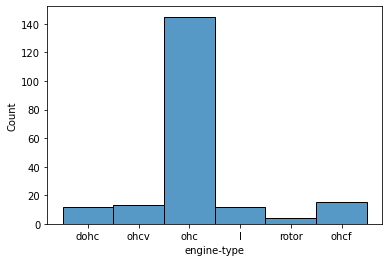

In [372]:
sns.histplot(df['engine-type'])

<AxesSubplot:xlabel='engine-type', ylabel='price'>

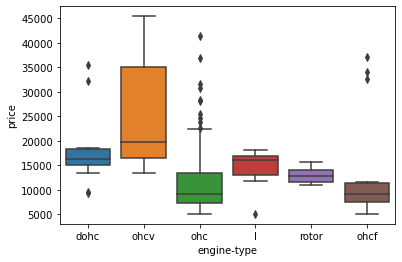

In [373]:
#ohcv has higher price on an average
sns.boxplot(x = 'engine-type', y = 'price', data = df)

In [374]:
df['num-of-cylinders'].unique()

array(['four', 'six', 'five', 'three', 'twelve', 'two', 'eight'],
      dtype=object)

<AxesSubplot:xlabel='num-of-cylinders', ylabel='Count'>

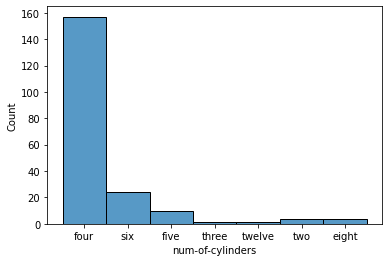

In [375]:
#most of the cars have 4 cylinders
sns.histplot(df['num-of-cylinders'])

<AxesSubplot:xlabel='num-of-cylinders', ylabel='price'>

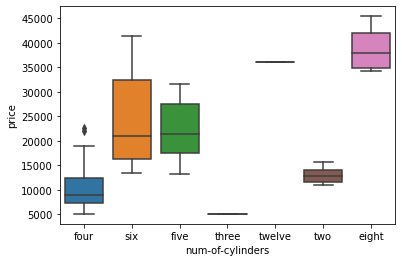

In [376]:
sns.boxplot(x = 'num-of-cylinders', y = 'price', data = df)

In [377]:
df['engine-size'].unique()

array([130, 152, 109, 136, 131, 108, 164, 209,  61,  90,  98, 122, 156,
        92,  79, 110, 111, 119, 258, 326,  91,  70,  80, 140, 134, 183,
       234, 308, 304,  97, 103, 120, 181, 151, 194, 132, 121, 146, 171,
       161, 141, 173, 145], dtype=int64)

<AxesSubplot:xlabel='engine-size', ylabel='price'>

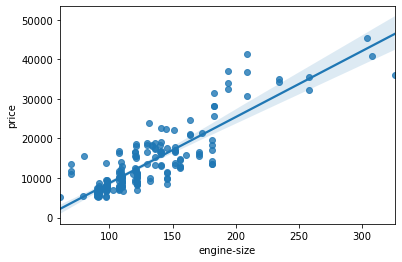

In [378]:
#Strong correlation
sns.regplot(x = 'engine-size', y = 'price', data = df)

In [379]:
df['fuel-system'].unique()

array(['mpfi', '2bbl', 'mfi', '1bbl', 'spfi', '4bbl', 'idi', 'spdi'],
      dtype=object)

<AxesSubplot:xlabel='fuel-system', ylabel='Count'>

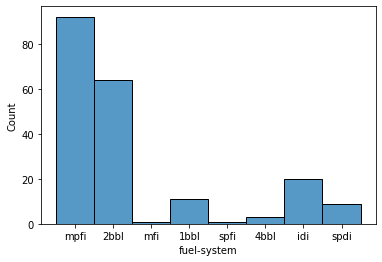

In [380]:
sns.histplot(df['fuel-system'])

<AxesSubplot:xlabel='fuel-system', ylabel='price'>

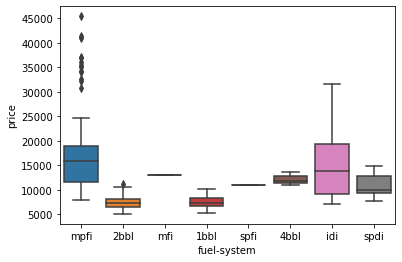

In [381]:
sns.boxplot(x = 'fuel-system', y = 'price', data = df)

In [382]:
df['bore'].unique()

array(['3.47', '2.68', '3.19', '3.13', '3.50', '3.31', '3.62', '2.91',
       '3.03', '2.97', '3.34', '3.60', '2.92', '3.15', '3.43', '3.63',
       '3.54', '3.08', '?', '3.39', '3.76', '3.58', '3.46', '3.80',
       '3.78', '3.17', '3.35', '3.59', '2.99', '3.33', '3.70', '3.61',
       '3.94', '3.74', '2.54', '3.05', '3.27', '3.24', '3.01'],
      dtype=object)

In [383]:
#we can clean '?' values with mean 
df['bore'].value_counts()

3.62    23
3.19    20
3.15    15
2.97    12
3.03    10
3.46     9
3.31     8
3.78     8
3.43     8
3.27     7
2.91     7
3.58     6
3.05     6
3.39     6
3.54     6
3.70     5
3.01     5
3.35     4
?        4
3.17     3
3.59     3
3.74     3
3.33     2
3.47     2
3.80     2
3.63     2
3.24     2
3.50     2
3.13     1
3.94     1
3.60     1
3.34     1
3.76     1
3.61     1
2.92     1
2.54     1
2.68     1
2.99     1
3.08     1
Name: bore, dtype: int64

In [384]:
df['bore'].replace('?', np.nan, inplace = True)


In [385]:
df.bore.unique()

array(['3.47', '2.68', '3.19', '3.13', '3.50', '3.31', '3.62', '2.91',
       '3.03', '2.97', '3.34', '3.60', '2.92', '3.15', '3.43', '3.63',
       '3.54', '3.08', nan, '3.39', '3.76', '3.58', '3.46', '3.80',
       '3.78', '3.17', '3.35', '3.59', '2.99', '3.33', '3.70', '3.61',
       '3.94', '3.74', '2.54', '3.05', '3.27', '3.24', '3.01'],
      dtype=object)

In [386]:
df['bore'] = pd.to_numeric(df['bore'], errors = 'coerce')

In [387]:
df['bore'] = df['bore'].fillna(df.mean())

In [388]:
df.bore.unique()

array([3.47, 2.68, 3.19, 3.13, 3.5 , 3.31, 3.62, 2.91, 3.03, 2.97, 3.34,
       3.6 , 2.92, 3.15, 3.43, 3.63, 3.54, 3.08,  nan, 3.39, 3.76, 3.58,
       3.46, 3.8 , 3.78, 3.17, 3.35, 3.59, 2.99, 3.33, 3.7 , 3.61, 3.94,
       3.74, 2.54, 3.05, 3.27, 3.24, 3.01])

<AxesSubplot:xlabel='bore', ylabel='price'>

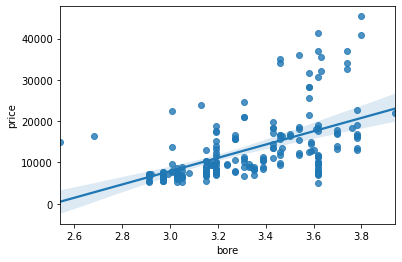

In [389]:
#Good enough correlation 
sns.regplot(x = 'bore', y = 'price', data = df)

In [390]:
df.stroke.unique()

array(['2.68', '3.47', '3.40', '2.80', '3.19', '3.39', '3.03', '3.11',
       '3.23', '3.46', '3.90', '3.41', '3.07', '3.58', '4.17', '2.76',
       '3.15', '?', '3.16', '3.64', '3.10', '3.35', '3.12', '3.86',
       '3.29', '3.27', '3.52', '2.19', '3.21', '2.90', '2.07', '2.36',
       '2.64', '3.08', '3.50', '3.54', '2.87'], dtype=object)

In [391]:
df.stroke.replace('?', np.nan, inplace = True)

In [392]:
df['stroke'] = pd.to_numeric(df['stroke'])

In [393]:
df['stroke'].fillna(df.mean(), inplace = True)

In [394]:
df.stroke.unique()

array([2.68, 3.47, 3.4 , 2.8 , 3.19, 3.39, 3.03, 3.11, 3.23, 3.46, 3.9 ,
       3.41, 3.07, 3.58, 4.17, 2.76, 3.15,  nan, 3.16, 3.64, 3.1 , 3.35,
       3.12, 3.86, 3.29, 3.27, 3.52, 2.19, 3.21, 2.9 , 2.07, 2.36, 2.64,
       3.08, 3.5 , 3.54, 2.87])

<AxesSubplot:xlabel='stroke', ylabel='price'>

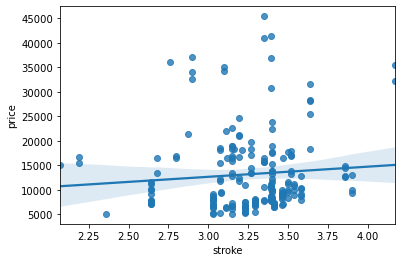

In [395]:
#Bad correlation, not a good predictor
sns.regplot( x = 'stroke', y = 'price', data = df)

In [396]:
df['compression-ratio'].unique()

array([ 9.  , 10.  ,  8.  ,  8.5 ,  8.3 ,  8.8 ,  9.5 ,  9.6 ,  9.41,
        9.4 ,  7.6 ,  7.  ,  9.2 , 10.1 ,  9.1 ,  8.1 , 11.5 ,  8.6 ,
       22.7 , 22.  , 21.5 ,  7.5 , 21.9 ,  7.8 ,  8.4 , 21.  ,  8.7 ,
        9.31,  9.3 ,  7.7 , 22.5 , 23.  ])

<AxesSubplot:xlabel='compression-ratio', ylabel='price'>

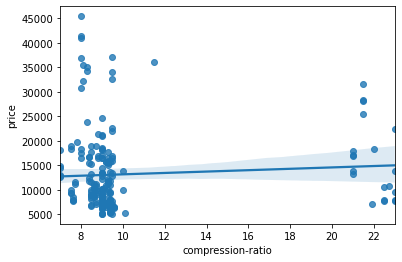

In [397]:
#Bad correlation, not a good predictor
sns.regplot( x = 'compression-ratio', y = 'price', data = df)

In [398]:
df['horsepower'].unique()

array(['111', '154', '102', '115', '110', '140', '101', '121', '182',
       '48', '70', '68', '88', '145', '58', '76', '60', '86', '100', '78',
       '90', '176', '262', '135', '84', '64', '120', '72', '123', '155',
       '184', '175', '116', '69', '55', '97', '152', '160', '200', '95',
       '142', '143', '207', '?', '73', '82', '94', '62', '56', '112',
       '92', '161', '156', '52', '85', '114', '162', '134', '106'],
      dtype=object)

In [399]:
#Can replace '?' value with mean, as there are just 2 '?' values
#df['horsepower'].value_counts()

In [400]:
df['horsepower'].replace('?', np.nan, inplace = True)

In [401]:
df['horsepower'] = pd.to_numeric(df.horsepower)

In [402]:
df['horsepower'].fillna(df.mean(), inplace = True)

<AxesSubplot:xlabel='horsepower', ylabel='price'>

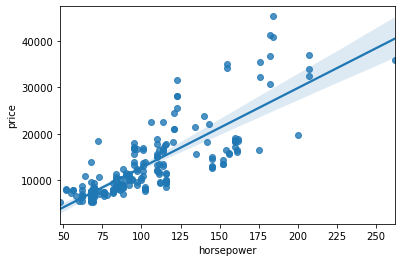

In [403]:
#Great Predictor
sns.regplot(x = 'horsepower', y = 'price', data = df)

In [404]:
df.columns

Index(['symboling', 'normalized-losses', 'make', 'fuel-type', 'aspiration',
       'num-of-doors', 'body-style', 'drive-wheels', 'engine-location',
       'wheel-base', 'length', 'width', 'height', 'curb-weight', 'engine-type',
       'num-of-cylinders', 'engine-size', 'fuel-system', 'bore', 'stroke',
       'compression-ratio', 'horsepower', 'peak-rpm', 'city-mpg',
       'highway-mpg', 'price'],
      dtype='object')

In [405]:
df['peak-rpm'].unique()

array(['5000', '5500', '5800', '4250', '5400', '5100', '4800', '6000',
       '4750', '4650', '4200', '4350', '4500', '5200', '4150', '5600',
       '5900', '?', '5250', '4900', '4400', '6600', '5300'], dtype=object)

In [406]:
#Can replace '?' value with mean, as there are just 2 '?' values
df['peak-rpm'].value_counts()

5500    36
4800    36
5000    27
5200    23
5400    11
6000     9
5800     7
5250     7
4500     7
4200     5
4150     5
4750     4
4350     4
5100     3
5900     3
4400     3
4250     3
?        2
6600     2
4900     1
5600     1
4650     1
5300     1
Name: peak-rpm, dtype: int64

In [407]:

df['peak-rpm'].replace('?', np.nan, inplace = True)


In [408]:
df['peak-rpm'] = pd.to_numeric(df['peak-rpm'])


In [409]:
df = df.fillna(df.mean())

In [410]:
df['peak-rpm'].isnull().sum()

0

In [411]:
df['peak-rpm'].unique()

array([5000.       , 5500.       , 5800.       , 4250.       ,
       5400.       , 5100.       , 4800.       , 6000.       ,
       4750.       , 4650.       , 4200.       , 4350.       ,
       4500.       , 5200.       , 4150.       , 5600.       ,
       5900.       , 5117.5879397, 5250.       , 4900.       ,
       4400.       , 6600.       , 5300.       ])

In [412]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 201 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          201 non-null    int64  
 1   normalized-losses  201 non-null    float64
 2   make               201 non-null    object 
 3   fuel-type          201 non-null    object 
 4   aspiration         201 non-null    object 
 5   num-of-doors       201 non-null    object 
 6   body-style         201 non-null    object 
 7   drive-wheels       201 non-null    object 
 8   engine-location    201 non-null    object 
 9   wheel-base         201 non-null    float64
 10  length             201 non-null    float64
 11  width              201 non-null    float64
 12  height             201 non-null    float64
 13  curb-weight        201 non-null    int64  
 14  engine-type        201 non-null    object 
 15  num-of-cylinders   201 non-null    object 
 16  engine-size        201 non

<AxesSubplot:xlabel='peak-rpm', ylabel='price'>

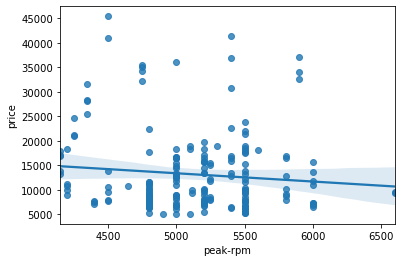

In [413]:
#Very bad relation, not a good predictor
sns.regplot(x = 'peak-rpm', y = 'price', data = df)

In [414]:
df['city-mpg'].unique()

array([21, 19, 24, 18, 17, 23, 20, 16, 15, 47, 38, 37, 31, 49, 30, 27, 25,
       13, 26, 36, 22, 14, 45, 28, 32, 35, 34, 29, 33], dtype=int64)

<AxesSubplot:xlabel='city-mpg', ylabel='price'>

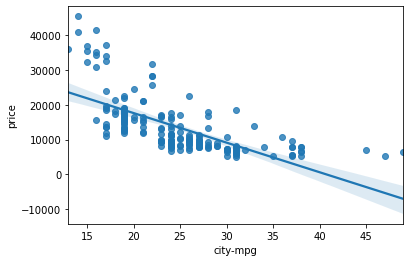

In [415]:
#Great correlation, good predictor
sns.regplot(x = 'city-mpg', y = 'price', data = df)

<AxesSubplot:xlabel='highway-mpg', ylabel='price'>

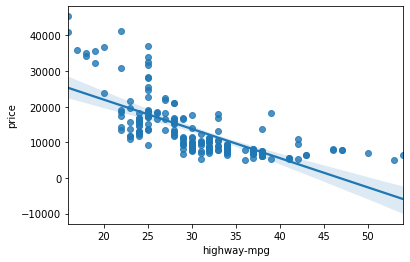

In [416]:
#Great correlation, good predictor
sns.regplot(x = 'highway-mpg', y = 'price', data = df)

<AxesSubplot:xlabel='city-mpg', ylabel='highway-mpg'>

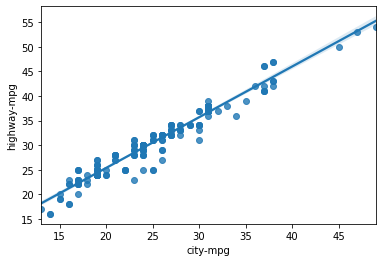

In [417]:
#There is a very strong correlation bewteen city-mpg and highway-mpg, therefore we can remove one column and keep one of the two
sns.regplot(x = 'city-mpg', y = 'highway-mpg', data = df)

### Data cleaning

In [418]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 201 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          201 non-null    int64  
 1   normalized-losses  201 non-null    float64
 2   make               201 non-null    object 
 3   fuel-type          201 non-null    object 
 4   aspiration         201 non-null    object 
 5   num-of-doors       201 non-null    object 
 6   body-style         201 non-null    object 
 7   drive-wheels       201 non-null    object 
 8   engine-location    201 non-null    object 
 9   wheel-base         201 non-null    float64
 10  length             201 non-null    float64
 11  width              201 non-null    float64
 12  height             201 non-null    float64
 13  curb-weight        201 non-null    int64  
 14  engine-type        201 non-null    object 
 15  num-of-cylinders   201 non-null    object 
 16  engine-size        201 non

In [419]:
df['normalized-losses'].fillna(df.mean(), inplace = True)

In [420]:
df['normalized-losses'].shape

(201,)

In [421]:
df['fuel-type'].unique()

array(['gas', 'diesel'], dtype=object)

In [422]:
from sklearn.preprocessing import LabelEncoder

In [423]:
le = LabelEncoder()

In [424]:
#df['fuel-system'].unique()

In [425]:
modeNOD = df['num-of-doors'].value_counts().idxmax()
df['num-of-doors'].replace(np.nan, modeNOD, inplace = True)

In [426]:
cols = ['fuel-type', 'aspiration', 'num-of-doors', 'engine-location' ]


In [427]:
for i in cols:
    df[i] = le.fit_transform(df[i])

In [428]:
df.corr()

,symboling,normalized-losses,fuel-type,aspiration,num-of-doors,engine-location,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
symboling,1.000000,4.662638e-01,0.196735,-0.054615,0.653739,2.123389e-01,-0.535987,-0.365404,-0.242423,-0.550160,-0.233118,-0.110581,-0.139896,-0.007992,-0.182196,0.075790,0.279719,-0.035527,0.036233,-0.082391
normalized-losses,0.466264,1.000000e+00,0.101546,-0.006911,0.340629,1.355890e-17,-0.056661,0.019424,0.086802,-0.373737,0.099404,0.112360,-0.029800,0.055127,-0.114713,0.217300,0.239544,-0.225016,-0.181877,0.133999
fuel-type,0.196735,1.015463e-01,1.000000,-0.408228,0.206001,4.091700e-02,-0.307237,-0.211187,-0.244356,-0.281578,-0.221046,-0.070779,-0.054435,-0.241033,-0.985231,0.168977,0.475759,-0.265676,-0.198690,-0.110326
aspiration,-0.054615,-6.910980e-03,-0.408228,1.000000,-0.077011,-5.749596e-02,0.256889,0.230085,0.305732,0.090336,0.321955,0.110040,0.227782,0.218190,0.307522,0.251235,-0.189982,-0.189237,-0.241851,0.179578
num-of-doors,0.653739,3.406294e-01,0.206001,-0.077011,1.000000,1.396711e-01,-0.421263,-0.370590,-0.212729,-0.513564,-0.192138,-0.015340,-0.106151,-0.000686,-0.187361,0.109817,0.225520,0.012041,0.029000,-0.032289
engine-location,0.212339,1.355890e-17,0.040917,-0.057496,0.139671,1.000000e+00,-0.189115,-0.053086,-0.052205,-0.109225,0.051287,0.199367,0.188404,-0.139351,-0.020467,0.342146,0.201937,-0.157132,-0.102964,0.331062
wheel-base,-0.535987,-5.666124e-02,-0.307237,0.256889,-0.421263,-1.891150e-01,1.000000,0.876024,0.814507,0.590742,0.782097,0.572027,0.493203,0.157964,0.250313,0.371250,-0.360233,-0.470606,-0.543304,0.584642
length,-0.365404,1.942356e-02,-0.211187,0.230085,-0.370590,-5.308613e-02,0.876024,1.000000,0.857170,0.492063,0.880665,0.685025,0.608941,0.123913,0.159733,0.579731,-0.286035,-0.665192,-0.698142,0.690628
width,-0.242423,8.680206e-02,-0.244356,0.305732,-0.212729,-5.220549e-02,0.814507,0.857170,1.000000,0.306002,0.866201,0.729436,0.544879,0.188814,0.189867,0.615006,-0.245852,-0.633531,-0.680635,0.751265
height,-0.550160,-3.737370e-01,-0.281578,0.090336,-0.513564,-1.092253e-01,0.590742,0.492063,0.306002,1.000000,0.307581,0.074694,0.180327,-0.060822,0.259737,-0.086941,-0.309913,-0.049800,-0.104812,0.135486


In [429]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 201 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          201 non-null    int64  
 1   normalized-losses  201 non-null    float64
 2   make               201 non-null    object 
 3   fuel-type          201 non-null    int32  
 4   aspiration         201 non-null    int32  
 5   num-of-doors       201 non-null    int32  
 6   body-style         201 non-null    object 
 7   drive-wheels       201 non-null    object 
 8   engine-location    201 non-null    int32  
 9   wheel-base         201 non-null    float64
 10  length             201 non-null    float64
 11  width              201 non-null    float64
 12  height             201 non-null    float64
 13  curb-weight        201 non-null    int64  
 14  engine-type        201 non-null    object 
 15  num-of-cylinders   201 non-null    object 
 16  engine-size        201 non

In [430]:
df['num-of-cylinders'].unique()

array(['four', 'six', 'five', 'three', 'twelve', 'two', 'eight'],
      dtype=object)

In [431]:
df['num-of-cylinders'].replace(['four', 'six', 'five', 'three', 'twelve', 'two', 'eight'], [4,6,5,3,12,2,8], inplace = True)

<AxesSubplot:xlabel='num-of-cylinders', ylabel='price'>

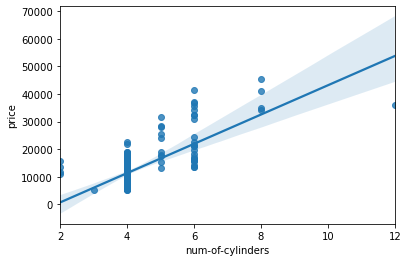

In [432]:
#Good Predictor
sns.regplot(x = 'num-of-cylinders', y = 'price', data = df)

In [433]:
del df['make']

In [434]:
del df['num-of-doors']


In [435]:
del df['stroke']

In [436]:
del df['compression-ratio']

In [437]:
del df['city-mpg']


In [438]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 201 entries, 0 to 204
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          201 non-null    int64  
 1   normalized-losses  201 non-null    float64
 2   fuel-type          201 non-null    int32  
 3   aspiration         201 non-null    int32  
 4   body-style         201 non-null    object 
 5   drive-wheels       201 non-null    object 
 6   engine-location    201 non-null    int32  
 7   wheel-base         201 non-null    float64
 8   length             201 non-null    float64
 9   width              201 non-null    float64
 10  height             201 non-null    float64
 11  curb-weight        201 non-null    int64  
 12  engine-type        201 non-null    object 
 13  num-of-cylinders   201 non-null    int64  
 14  engine-size        201 non-null    int64  
 15  fuel-system        201 non-null    object 
 16  bore               201 non

In [439]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [440]:
ct = ColumnTransformer([('encoder', OneHotEncoder(),[4,5,12,15])], remainder = 'passthrough')

In [441]:
df = ct.fit_transform(df)


In [442]:
print(df)

[[1.0000e+00 0.0000e+00 0.0000e+00 ... 5.0000e+03 2.7000e+01 1.3495e+04]
 [1.0000e+00 0.0000e+00 0.0000e+00 ... 5.0000e+03 2.7000e+01 1.6500e+04]
 [0.0000e+00 0.0000e+00 1.0000e+00 ... 5.0000e+03 2.6000e+01 1.6500e+04]
 ...
 [0.0000e+00 0.0000e+00 0.0000e+00 ... 5.5000e+03 2.3000e+01 2.1485e+04]
 [0.0000e+00 0.0000e+00 0.0000e+00 ... 4.8000e+03 2.7000e+01 2.2470e+04]
 [0.0000e+00 0.0000e+00 0.0000e+00 ... 5.4000e+03 2.5000e+01 2.2625e+04]]


In [443]:
df= pd.DataFrame(df)

In [444]:
df

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,64.1,48.8,2548.0,4.0,130.0,3.47,111.0,5000.0,27.0,13495.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,64.1,48.8,2548.0,4.0,130.0,3.47,111.0,5000.0,27.0,16500.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,65.5,52.4,2823.0,6.0,152.0,2.68,154.0,5000.0,26.0,16500.0
3,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,66.2,54.3,2337.0,4.0,109.0,3.19,102.0,5500.0,30.0,13950.0
4,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,66.4,54.3,2824.0,5.0,136.0,3.19,115.0,5500.0,22.0,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,68.9,55.5,2952.0,4.0,141.0,3.78,114.0,5400.0,28.0,16845.0
197,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,68.8,55.5,3049.0,4.0,141.0,3.78,160.0,5300.0,25.0,19045.0
198,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,68.9,55.5,3012.0,6.0,173.0,3.58,134.0,5500.0,23.0,21485.0
199,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,68.9,55.5,3217.0,6.0,145.0,3.01,106.0,4800.0,27.0,22470.0


### Model Selection

In [445]:
from sklearn.model_selection import train_test_split
from sklearn import linear_model

In [446]:
X = df.iloc[:,:-1]
y = df.iloc[:,-1]

In [557]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.25, random_state = 6)

In [558]:
regr = linear_model.LinearRegression()

In [559]:
regr.fit(X_train,y_train)

LinearRegression()

In [560]:
from sklearn import metrics

In [561]:
#print(dir(metrics))

In [562]:
#metrics.__all__?

In [563]:
#print(dir(regr))

In [564]:
y_pred = regr.predict(X_test)

MSE 7635271.52946921
r2 0.8781869222678425
Accuracy 87.81869222678425


<AxesSubplot:xlabel='38'>

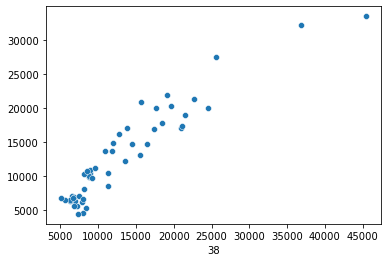

In [565]:
from sklearn.metrics import mean_squared_error, r2_score

print("MSE", mean_squared_error(y_test,y_pred))
print("r2", r2_score(y_test, y_pred))
print("Accuracy", r2_score(y_test, y_pred)* 100)
sns.scatterplot(x = y_test, y = y_pred)
#print(metrics.adjusted_rand_score(y_test, y_pred)

In [566]:
y_pred_train = regr.predict(X_train)

MSE 5520981.5427148435
r2 0.9122121065000793
Accuracy 91.22121065000793


<AxesSubplot:xlabel='38'>

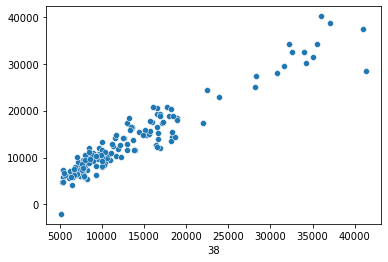

In [567]:
print("MSE", mean_squared_error(y_train,y_pred_train))
print("r2", r2_score(y_train, y_pred_train))
print("Accuracy", r2_score(y_train, y_pred_train)* 100)
sns.scatterplot(x = y_train, y = y_pred_train)